# Yolo model with data augmentation

**Received Dataset** : this dataset has two classes namely Dromedarii and Scupense and each class further categorised based on their gender, we can imagine 2 layer heirarchy in dataset
1st is category of tick and next is their gender so we restructured dataset in 4 classes 

For example : **Hyalomma Dromedarii_Female, Hyalomma Dromedarii_Male, Hyalomma Scupense_Female, Hyalomma and Scupense_Male** abbreviated as D_F, D_M, S_F and S_M respectively.

> Indented block



**Data Understanding :**

No. of Categories Sample wise
S_F = 17 samples,
S_M = 47 samples,
D_F  = 27 sample, 
D_M = 61 samples

Data is quite unbalanced as S_F and D_F are in minority and S_M and D_M are in majority



**Objective :** To detect the tick in an image and classification based on 4 categories defined above

**Approach :** In our first approach we should use yolo for object detection and classification                                

**Note :** *dataset is not prepared according to the format required in yolov5*
                                                         
we've have prepared dataset manually using [makesense.ai](https://www.makesense.ai/)      

To tackle **imbalance** of the data we've used rotation as data augmentation technique, we rotated images on angle of 90, 180 and 270 respectively only on Classes S_F and D_F because they are in minority.

now we'll train two models one with actual data other with augmented data

In [ ]:
#% cd /content/drive/MyDrive

In [ ]:
#!git clone https://github.com/ultralytics/yolov5  # clone repo

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

%cd /content/drive/MyDrive/yolov5_with_data_augmentation
%pip install -qr requirements.txt  # install dependencies

import torch
from IPython.display import Image, clear_output  # to display images

clear_output()
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.9.0+cu102 (Tesla T4)


[link text](https://)

YOLOv5 augmented notebook, the only augmentation here that i've done is "rotation" 

Code to rotate the image by angle of 90, 180 and 270 

In [ ]:
# Augmentation 
# random shift and random cropping is not required
# import os
# import cv2
# import numpy as np
# from scipy.ndimage import rotate


# def rotate_img(img, angle, bg_patch=(5,5)):
#     assert len(img.shape) <= 3, "Incorrect image shape"
#     rgb = len(img.shape) == 3
#     if rgb:
#         bg_color = np.mean(img[:bg_patch[0], :bg_patch[1], :], axis=(0,1))
#     else:
#         bg_color = np.mean(img[:bg_patch[0], :bg_patch[1]])
#     img = rotate(img, angle, reshape=False)
#     mask = [img <= 0, np.any(img <= 0, axis=-1)][rgb]
#     img[mask] = bg_color
#     return img
# count =0
# for image_name in os.listdir('/content/drive/MyDrive/tick_yolo_data_preparation/images/train'):
#   if "SF" in image_name :

#     img = cv2.imread('/content/drive/MyDrive/tick_yolo_data_preparation/images/train/'+image_name)
#     img1 = rotate_img(img,90)
#     cv2.imwrite(os.path.join('/content/drive/MyDrive/augmented ' , str(count)+'SF_90.jpg'), img1)
#     img2 = rotate_img(img,180)
#     cv2.imwrite(os.path.join('/content/drive/MyDrive/augmented ' , str(count)+'SF_180.jpg'), img2)
#     img3 = rotate_img(img,270)
#     cv2.imwrite(os.path.join('/content/drive/MyDrive/augmented ' , str(count)+'SF_270.jpg'), img3)
#     count+=1

# for image_name in os.listdir('/content/drive/MyDrive/tick_yolo_data_preparation/images/train'):
#   if "DF" in image_name :

#     img = cv2.imread('/content/drive/MyDrive/tick_yolo_data_preparation/images/train/'+image_name)
#     img1 = rotate_img(img,90)
#     cv2.imwrite(os.path.join('/content/drive/MyDrive/augmented ' , str(count)+'DF_90.jpg'), img1)
#     img2 = rotate_img(img,180)
#     cv2.imwrite(os.path.join('/content/drive/MyDrive/augmented ' , str(count)+'DF_180.jpg'), img2)
#     img3 = rotate_img(img,270)
#     cv2.imwrite(os.path.join('/content/drive/MyDrive/augmented ' , str(count)+'DF_270.jpg'), img3)
#     count+=1

In [ ]:
# Train YOLOv5s on COCO128 for 3 epochs
!python train.py --img 640 --batch 16 --epochs 150 --data coco128.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=coco128.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=150, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache_images=True, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, entity=None, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, upload_dataset=False, bbox_interval=-1, save_period=-1, artifact_alias=latest, local_rank=-1, freeze=0
remote: Enumerating objects: 10, done.
remote: Counting objects: 100% (10/10), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 10 (delta 2), reused 3 (delta 2), pack-reused 0
Unpacking objects: 100% (10/10), done.
github: Command 'git fetch && git config --get remote.origin.url' timed out after 5 seconds
From https://github.com/ultralytics/yolov5
   d8f1883..b74929c  master     -> origin/master
YOLOv5 🚀 2021-7-31 torch 1.9.0

Performance metric

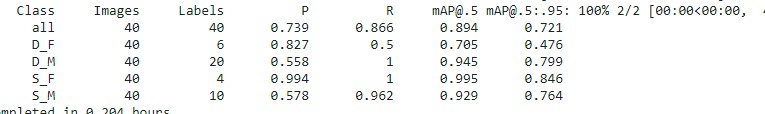

Model Accuracy is 89% with data Augmentation

In [4]:
!python detect.py --weights /content/drive/MyDrive/yolov5_with_data_augmentation/runs/train/exp8/weights/best.pt --img 640 --conf 0.25 --source /content/drive/MyDrive/test_yolo/

python3: can't open file 'detect.py': [Errno 2] No such file or directory


## Predictions

In [6]:
import cv2
from google.colab.patches import cv2_imshow
img = cv2.imread("runs/detect/exp8/SM_val.jpg")
cv2_imshow(img)

AttributeError: ignored

Trainin Batches

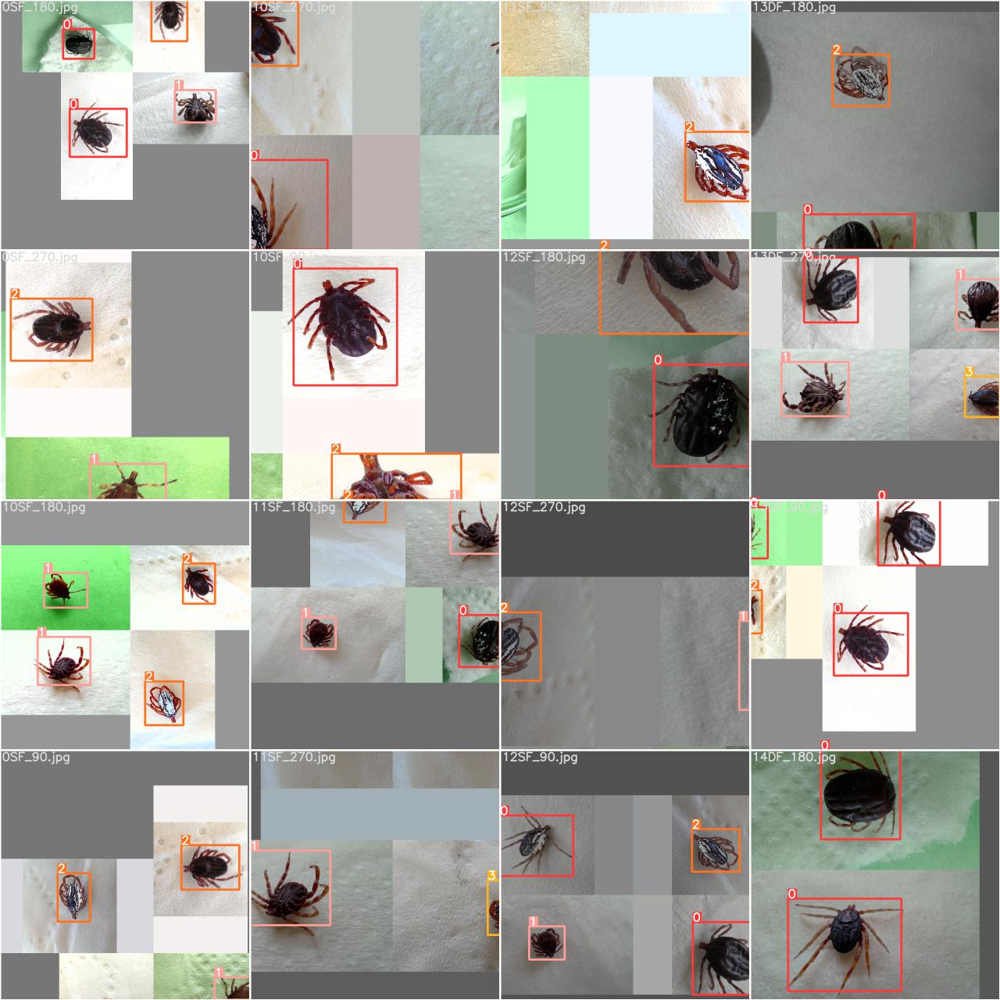

In [ ]:
img = cv2.imread("runs/train/exp9/train_batch0.jpg")
cv2_imshow(img)

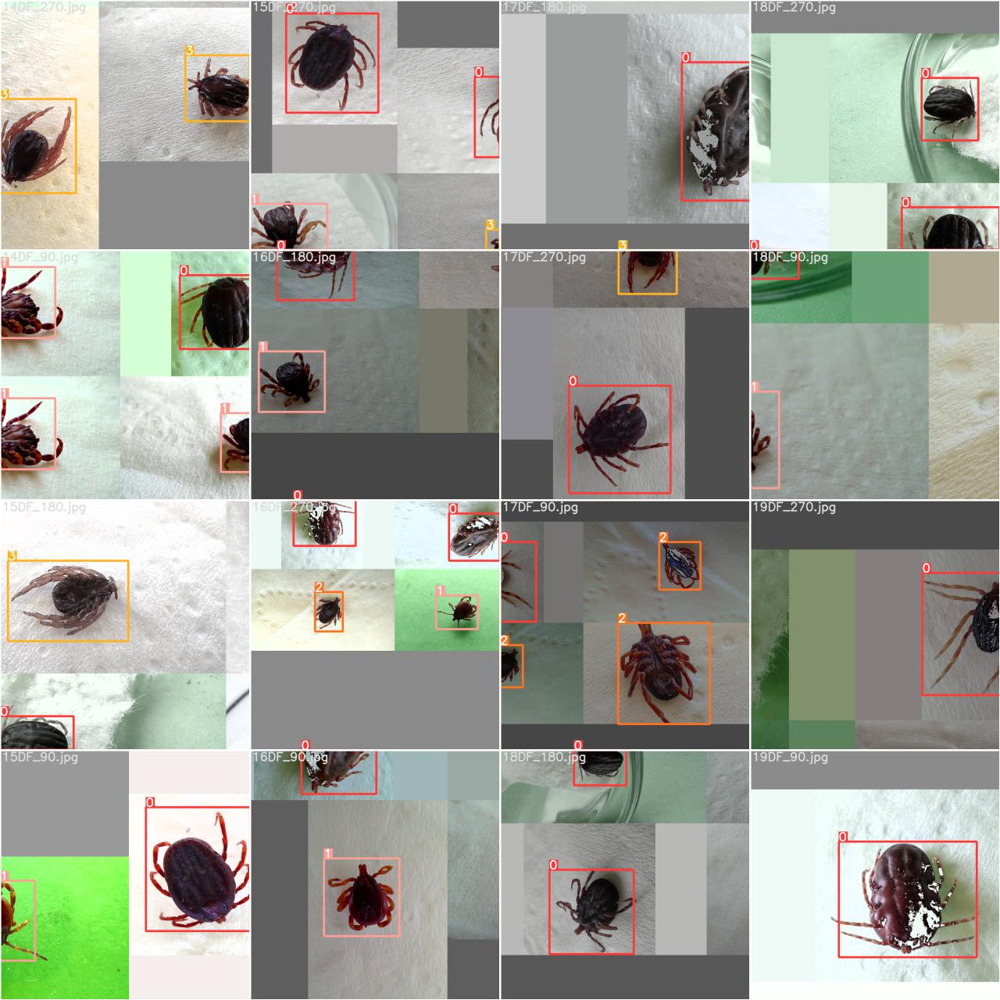

In [ ]:
img = cv2.imread("runs/train/exp9/train_batch1.jpg")
cv2_imshow(img)

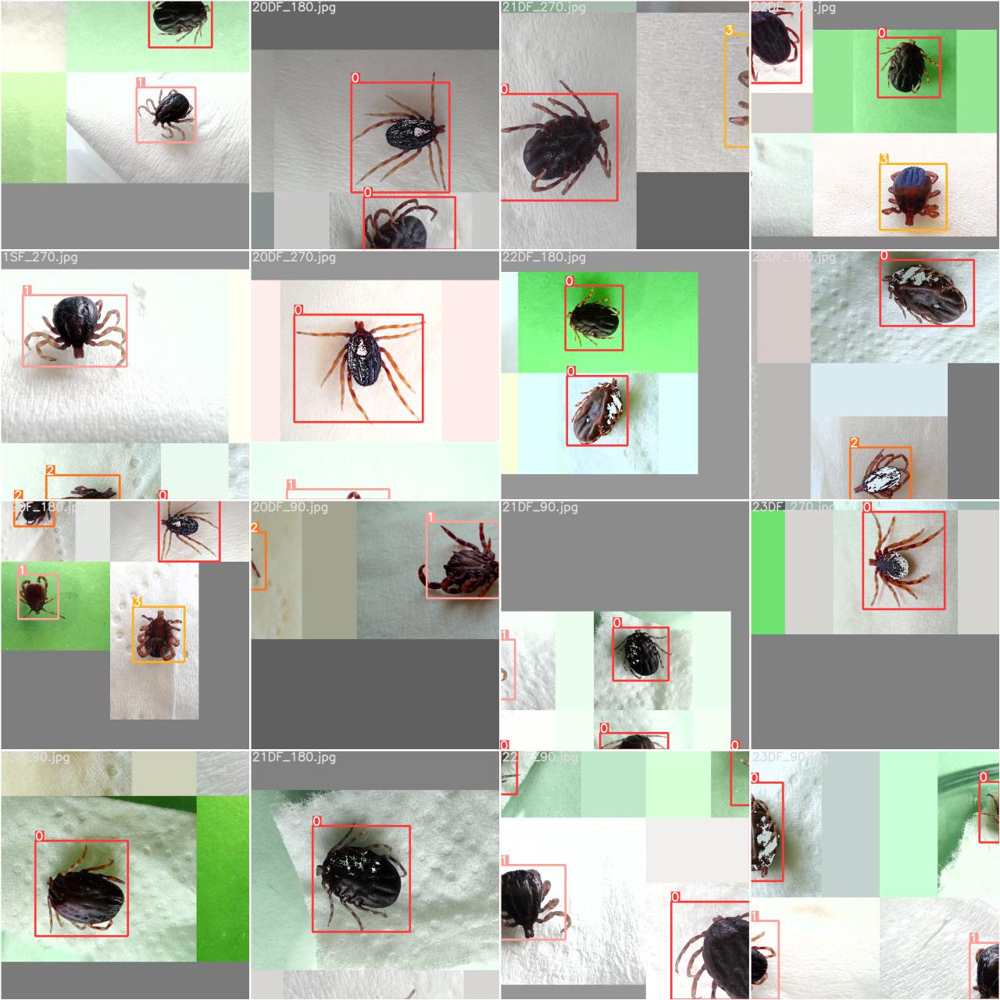

In [ ]:
img = cv2.imread("runs/train/exp9/train_batch2.jpg")
cv2_imshow(img)

##original validation batch 

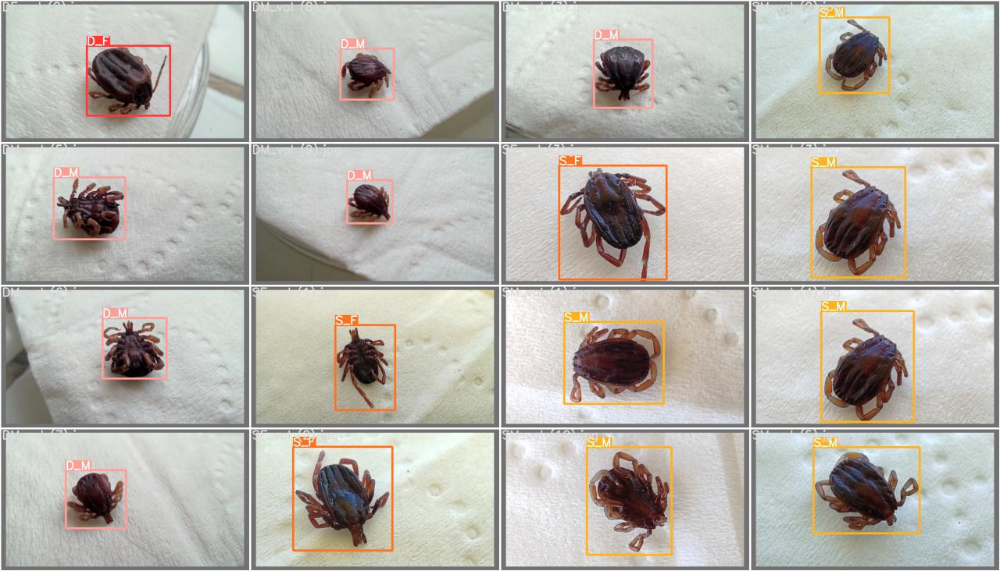

In [ ]:
img = cv2.imread("runs/train/exp9/val_batch0_labels.jpg")
cv2_imshow(img)

##Predicted validation batch

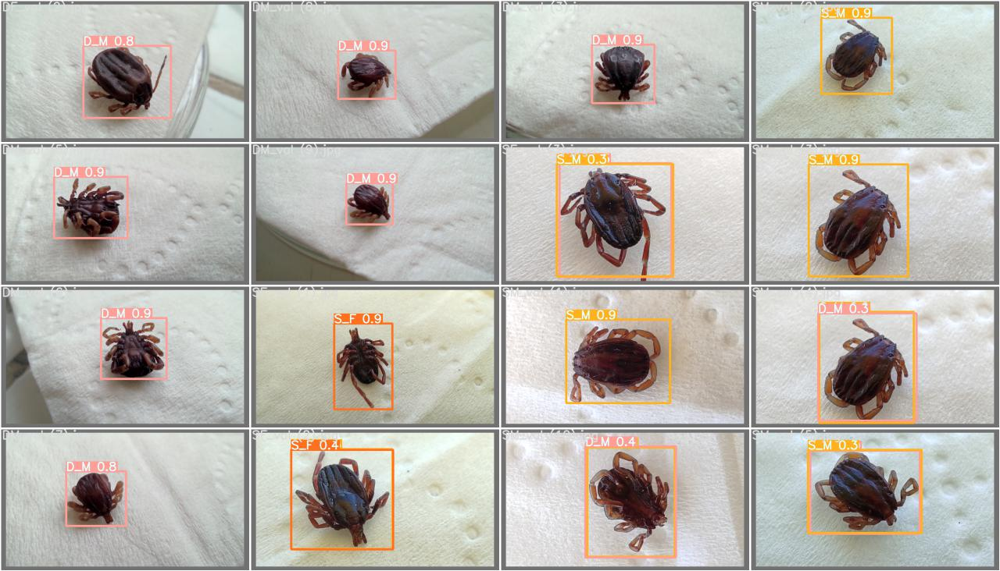

In [ ]:
img = cv2.imread("runs/train/exp9/val_batch0_pred.jpg")
cv2_imshow(img)

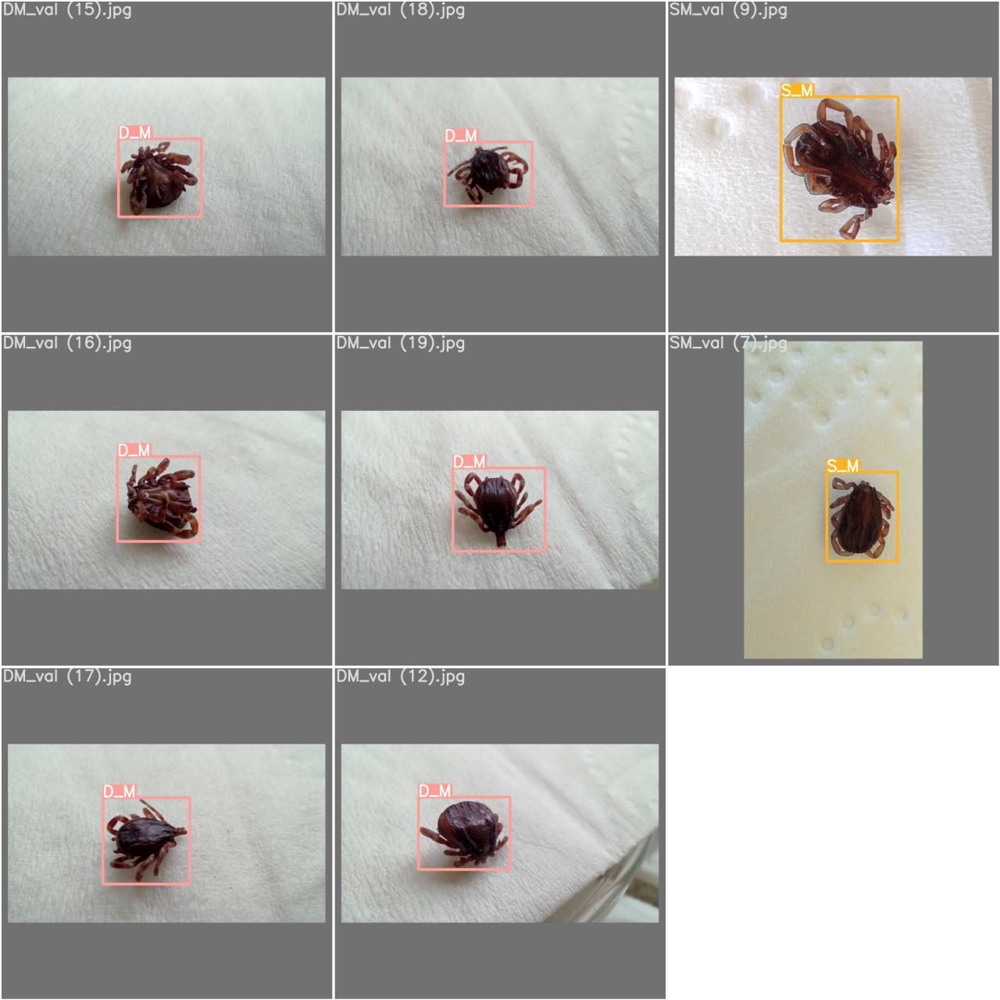

In [ ]:
img = cv2.imread("runs/train/exp9/val_batch1_labels.jpg")
cv2_imshow(img)

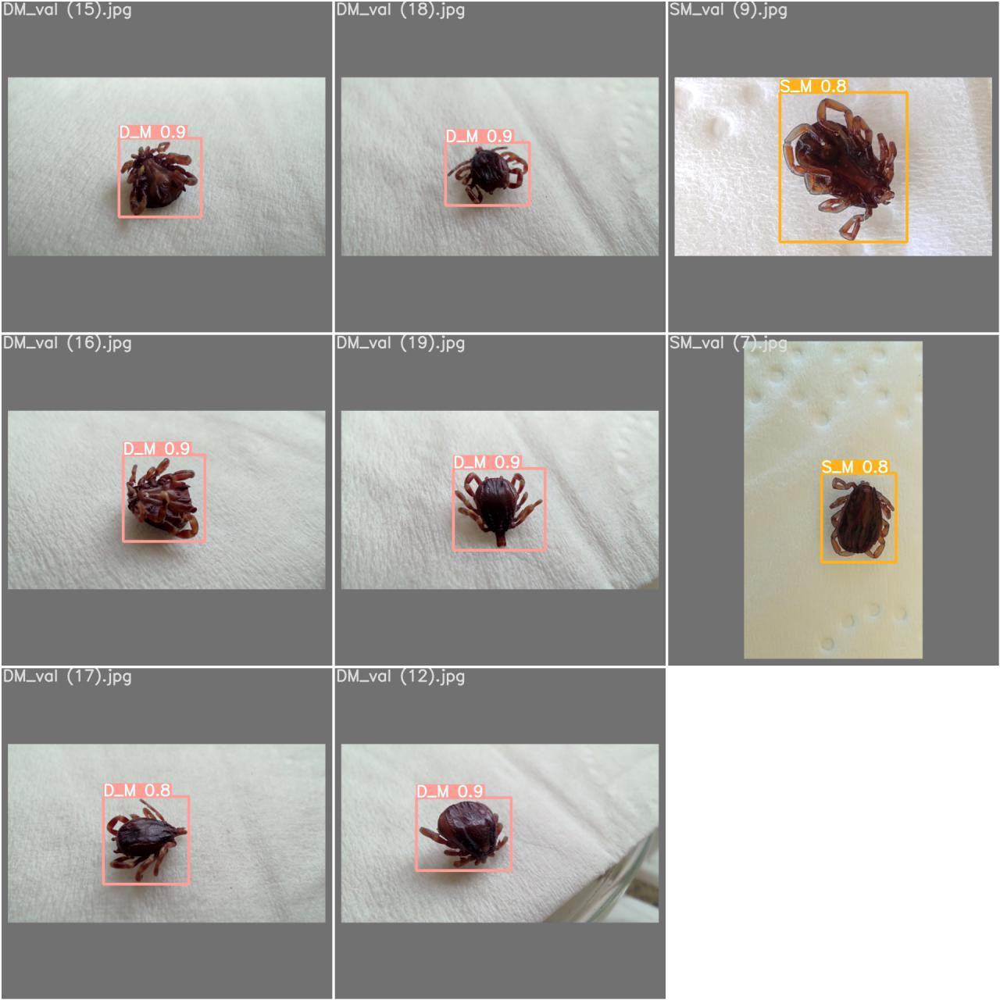

In [ ]:
img = cv2.imread("runs/train/exp9/val_batch1_pred.jpg")
cv2_imshow(img)

##F1 curve

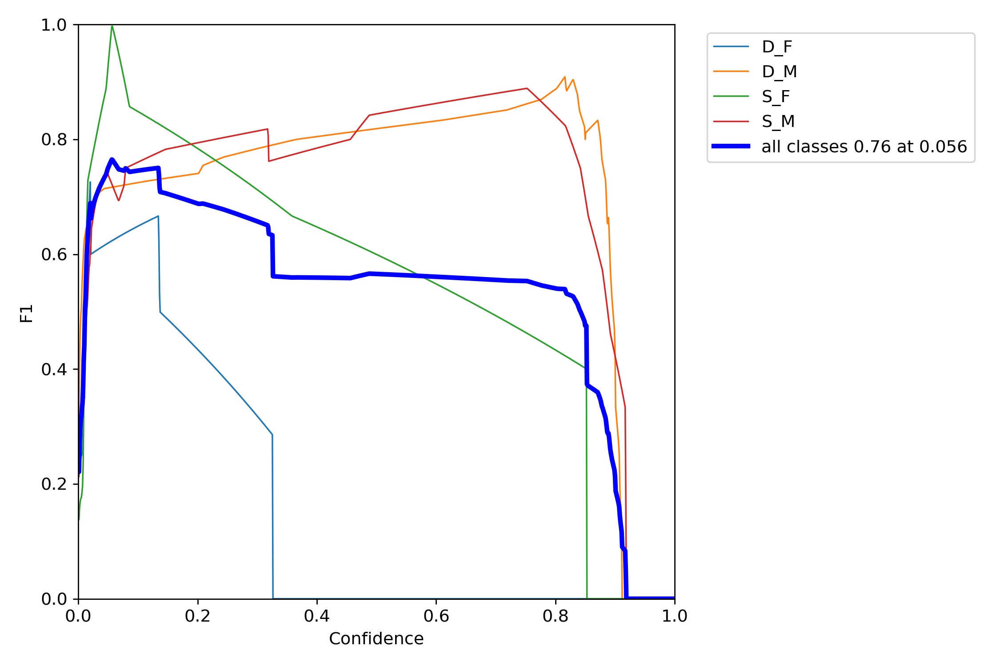

In [ ]:
img = cv2.imread("runs/train/exp9/F1_curve.png")
cv2_imshow(img)

##PR_curve

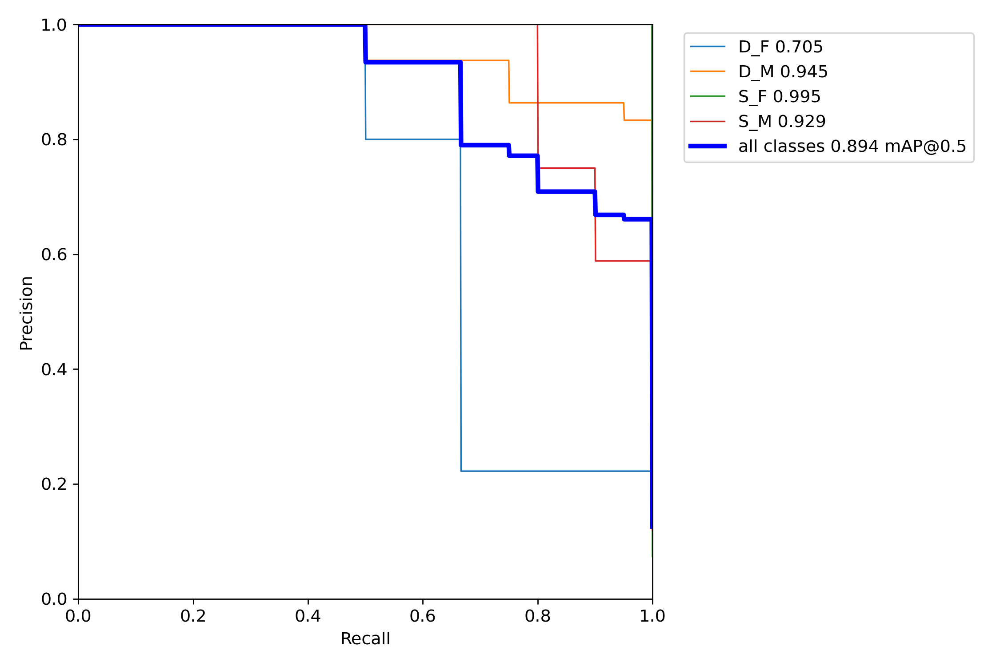

In [ ]:
img = cv2.imread("runs/train/exp9/PR_curve.png")
cv2_imshow(img)

##P_curve

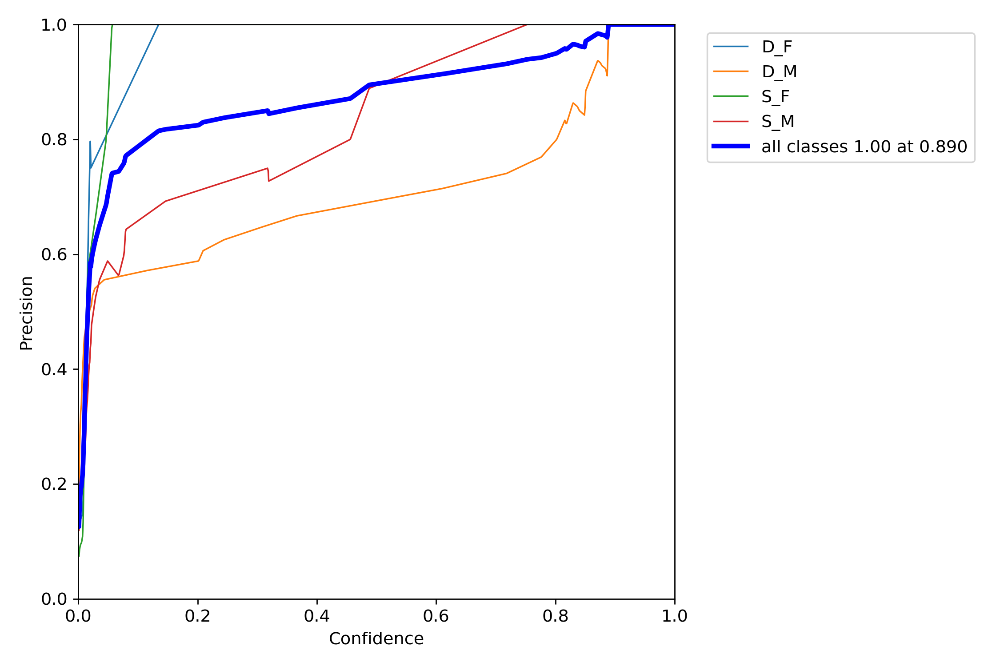

In [ ]:
img = cv2.imread("runs/train/exp9/P_curve.png")
cv2_imshow(img)

##R_curve

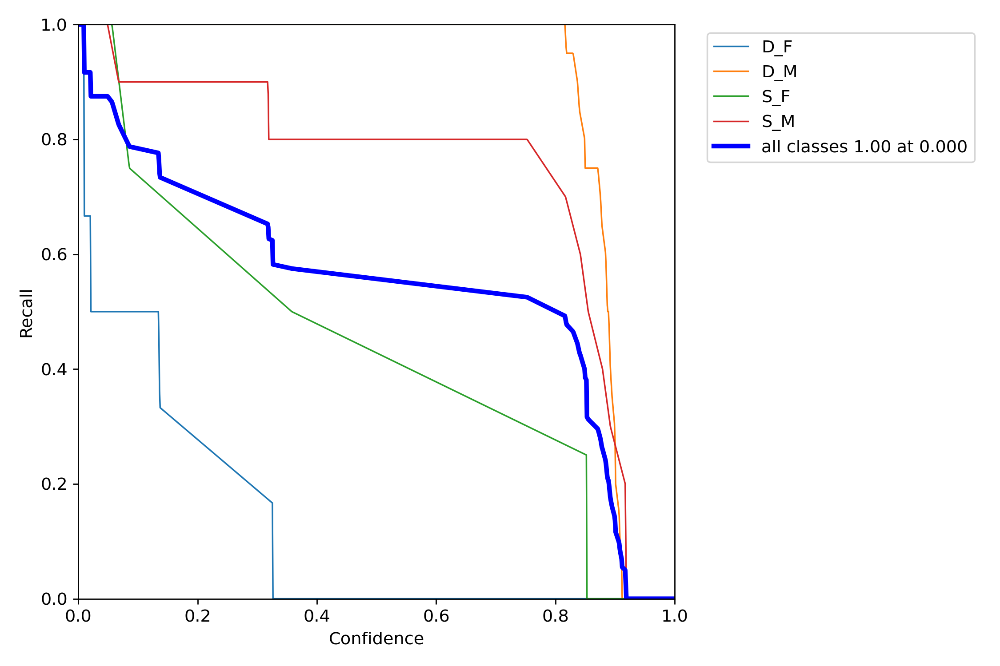

In [ ]:
img = cv2.imread("runs/train/exp9/R_curve.png")
cv2_imshow(img)

##confusion matrix

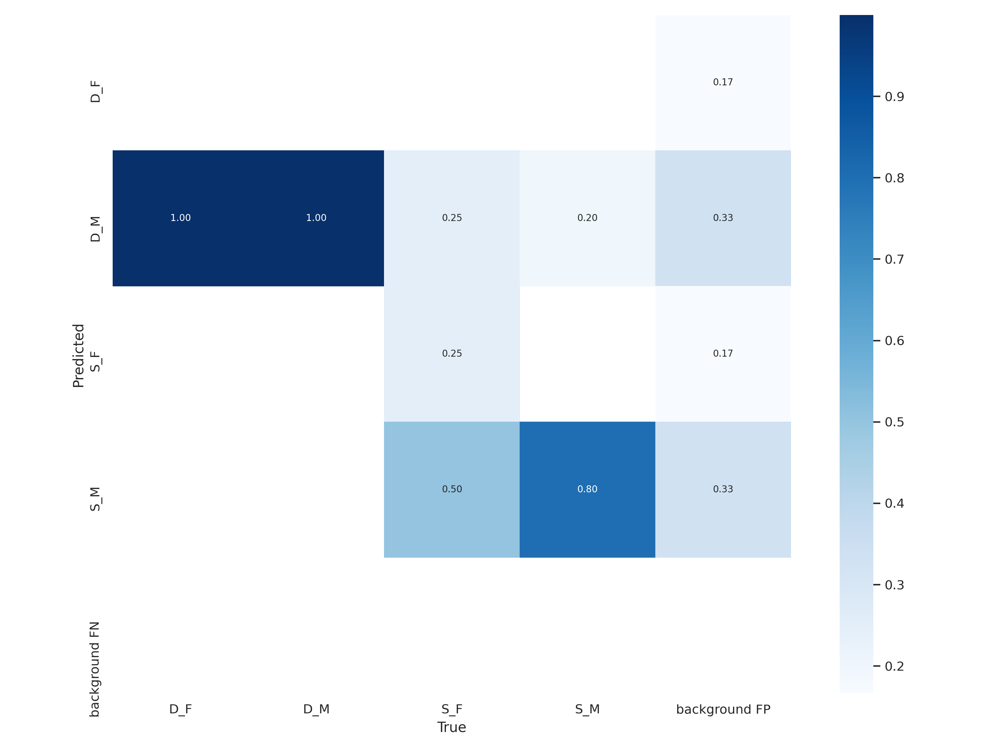

In [ ]:
img = cv2.imread("runs/train/exp9/confusion_matrix.png")
cv2_imshow(img)

##Loss with train and validation

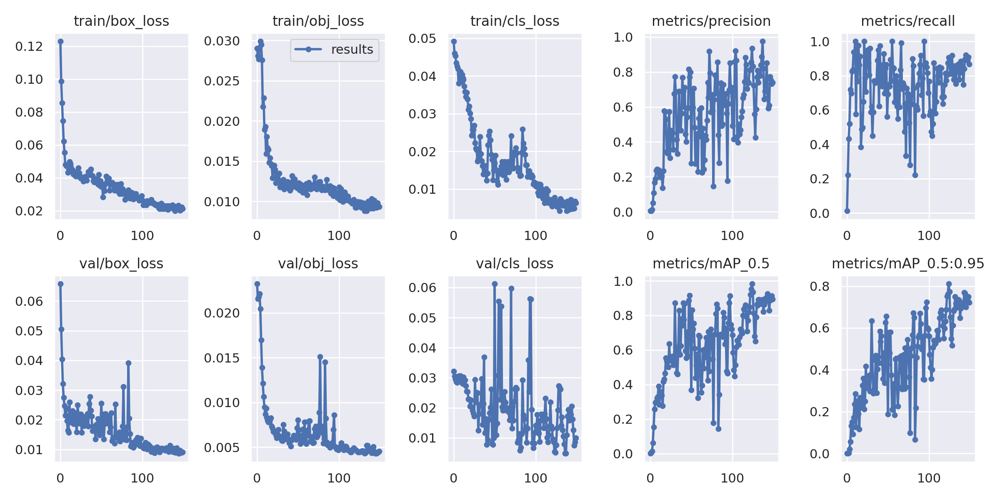

In [ ]:
img = cv2.imread("runs/train/exp9/results.png")
cv2_imshow(img)